# Custom modelis. Treniravimas.

In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import metrics
from datetime import datetime
import os
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.callbacks import TensorBoard
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img

In [2]:
project_path = "C:\\Users\\jolged\PycharmProjects\\Auto_Recognition2\\"

version = "v1.1.0"
ts = int(datetime.now().timestamp())
model_name = f'model_{version}_{ts}.hdf5'
run_name = f'run_{ts}'
train_dataset_path = project_path + f"data\\{version}\\train"
test_dataset_path = project_path + f"data\\{version}\\test"


model_path = project_path + f"models\\model_{version}_{ts}\\"
os.makedirs(model_path, exist_ok=True)
model_outputs = model_path + "outputs\\"
os.makedirs(model_outputs, exist_ok=True)

model_metrics = [
    "accuracy",
    "Precision",
    "Recall",
    "AUC",
    "FalseNegatives",
    "FalsePositives",
    "TrueNegatives",
    "TruePositives",
]

In [3]:
import wandb
from wandb.keras import WandbMetricsLogger, WandbModelCheckpoint

wandb.login()

wandb: Currently logged in as: jolita-gedminaite1. Use `wandb login --relogin` to force relogin


True

In [4]:
wandb_configs = {
        # Duomenys
        "train_dataset_path": train_dataset_path,
        "test_dataset_path": test_dataset_path,
        "labels": "inferred",
        "label_mode": "binary",
        "color_mode": "rgb",
        "batch_size": 35,
        "image_size": (224, 224),
        "shuffle": False,
        "seed": 42,
        "modelis" : """
                model = keras.Sequential([
                #     layers.experimental.preprocessing.Rescaling(1./255, input_shape=tuple(config.image_size) + (3,)),
                    layers.Conv2D(128, (3, 3), activation='relu', input_shape=tuple(config.image_size) + (3,)),
                    layers.Conv2D(128, (3, 3), activation='relu'),
                    layers.MaxPooling2D((2,2)),
                    layers.Dropout(0.2),
                    layers.Conv2D(64, (3, 3), activation="relu"),
                    layers.MaxPooling2D((2,2)),
                    layers.Dropout(0.2),
                    layers.Conv2D(32, (3, 3), activation="relu"),
                    layers.MaxPooling2D((2,2)),
                    layers.Flatten(),
                    layers.Dense(128, activation="relu"),
                    layers.Dense(1, activation="sigmoid"),
                ])
        """,
        "model_name": model_name,
        

        "optimizer": "adam",
        "loss":"binary_crossentropy",
    
        "metrics":["accuracy", 
                    'Precision',
                    "Recall",
                    'AUC',
                    "FalseNegatives",
                    "FalsePositives",
                    "TrueNegatives",
                    "TruePositives"
                  ],
        "epoch": 10,
}
    

In [5]:
#Paleidžiam wandb
wandb.init(
    project="Auto_Recognition",   
    entity="jolita-gedminaite1", #Optional
    name=run_name,
    sync_tensorboard=True, # to sync the event files for a hosted TensorBoard environment
    config=wandb_configs,
)

In [6]:
# Parametrai
config = wandb.config

# Treniravimo duomenys
train_datagen = keras.preprocessing.image.ImageDataGenerator(
    rescale=1. / 255)

train_data = train_datagen.flow_from_directory(
    config.train_dataset_path,
    target_size=config.image_size,
    batch_size=config.batch_size,
    class_mode=config.label_mode)

# Testavimo duomenys
test_datagen = keras.preprocessing.image.ImageDataGenerator(rescale=1. / 255)
test_data = test_datagen.flow_from_directory(
    config.test_dataset_path,
    target_size=config.image_size,
    batch_size=config.batch_size,
    class_mode=config.label_mode,
    shuffle=config.shuffle)

Found 701 images belonging to 2 classes.
Found 156 images belonging to 2 classes.


In [7]:
# Modelio aprašymas
model = keras.Sequential([
    layers.Conv2D(128, (3, 3), activation='relu', input_shape=tuple(config.image_size) + (3,)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Dropout(0.2),
    layers.Conv2D(64, (3, 3), activation="relu"),
    layers.MaxPooling2D((2,2)),
    layers.Dropout(0.2),
    layers.Conv2D(32, (3, 3), activation="relu"),
    layers.MaxPooling2D((2,2)),
    layers.Flatten(),
    layers.Dense(128, activation="relu"),
    layers.Dense(1, activation="sigmoid"),
])

checkpoint = keras.callbacks.ModelCheckpoint(filepath=os.path.join(model_path, 
                                                                   model_name), 
                                                                    save_best_only=True, mode=min)


# Modelio kompiliavimas
model.compile(loss=config.loss,
              optimizer=tf.keras.optimizers.Adam(lr=1e-4),
              metrics=config.metrics)

In [8]:
# # Treniravimas
# history = model.fit(
#     train_data,
#     validation_data=test_data,
#     epochs=config.epoch,
#     callbacks=[checkpoint, WandbMetricsLogger(),TensorBoard(log_dir=wandb.run.dir)]
# )

# pd.DataFrame(history.history).to_excel(model_outputs+'history.xlsx')

In [9]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 128)     3584      
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 128)     147584    
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 128)    0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 110, 110, 128)     0         
                                                                 
 conv2d_2 (Conv2D)           (None, 108, 108, 64)      73792     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                    

In [11]:
model_history = pd.read_excel(model_outputs + "history.xlsx", index_col="Unnamed: 0")
model_history.columns

Index(['loss', 'accuracy', 'precision', 'recall', 'auc', 'false_negatives',
       'false_positives', 'true_negatives', 'true_positives', 'val_loss',
       'val_accuracy', 'val_precision', 'val_recall', 'val_auc',
       'val_false_negatives', 'val_false_positives', 'val_true_negatives',
       'val_true_positives'],
      dtype='object')

In [12]:
def plot_metrics(df, path):
    fig = plt.figure(figsize=(15, 6))

    ax = fig.add_subplot(221)
    ax.title.set_text("Model Loss")
    ax.plot(df["loss"], label="train")
    ax.plot(df["val_loss"], label="test")
    ax.legend()

    ax = fig.add_subplot(222)
    ax.title.set_text("Model Accuracy")
    ax.plot(df["accuracy"], label="train")
    ax.plot(df["val_accuracy"], label="test")
    ax.legend()

    ax = fig.add_subplot(223)
    ax.title.set_text("Model Precision")
    ax.plot(df["precision"], label="train")
    ax.plot(df["val_precision"], label="test")
    ax.legend()

    ax = fig.add_subplot(224)
    ax.title.set_text("Model Recall")
    ax.plot(df["recall"], label="train")
    ax.plot(df["val_recall"], label="test")
    ax.legend()

    fig.savefig(path + "Loss_Accuracy_Precision_Recall.png")

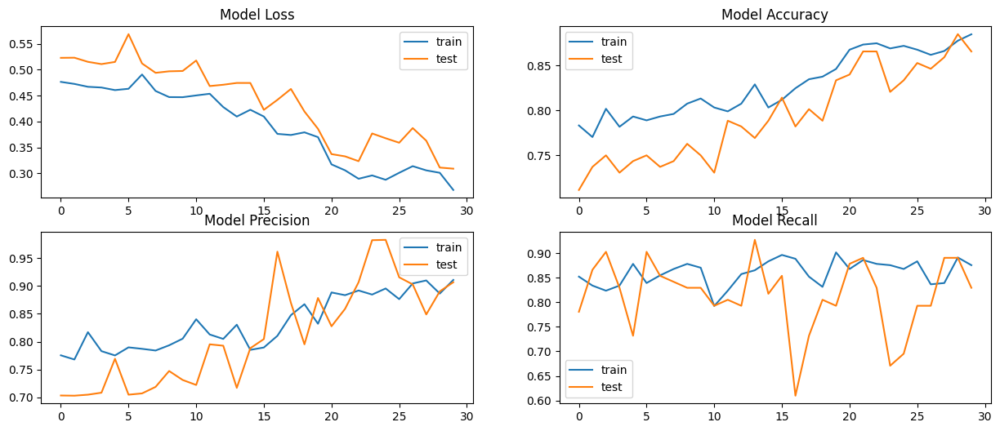

In [14]:
plot_metrics(model_history, model_outputs)

5/5 [==============================] - 14s 2s/step


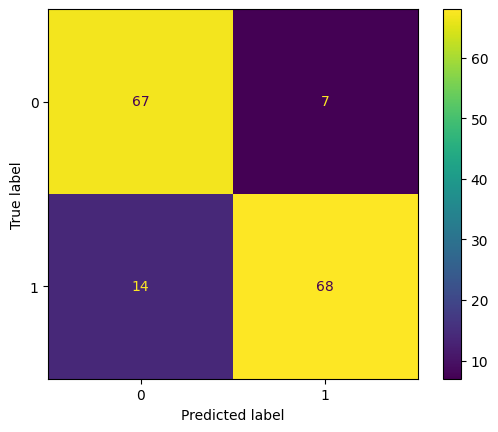

In [16]:
model = tf.keras.models.load_model(os.path.join(model_path, model_name))
predictions = model.predict(test_data, verbose=1)

predicted_classes = [1 if pred > 0.5 else 0 for pred in predictions]
labels_test = test_data.classes

report = metrics.classification_report(labels_test, predicted_classes, output_dict=True)
report = pd.DataFrame.from_dict(report).T
cm = metrics.confusion_matrix(labels_test, predicted_classes)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_data.class_indices)
cm_display.plot()

plt.savefig(model_outputs + "Confusion_matrix.png")
plt.show()

In [17]:
report

,precision,recall,f1-score,support
0,0.827160,0.905405,0.864516,74.000000
1,0.906667,0.829268,0.866242,82.000000
accuracy,0.865385,0.865385,0.865385,0.865385
macro avg,0.866914,0.867337,0.865379,156.000000
weighted avg,0.868952,0.865385,0.865423,156.000000


In [18]:
wandb.log({"report": report})
wandb.sklearn.plot_confusion_matrix(labels_test, predicted_classes, list(test_data.class_indices.values()))

In [19]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc


def plot_roc(path, y_prob, y_true):
    # Apskaičiuojam ROC kreivę ir AUC
    fpr, tpr, thresholds = roc_curve(y_true, y_prob)
    roc_auc = auc(fpr, tpr)

    # Randam minimalaus atstumo thresholdą (minimum-D)
    distances = np.sqrt((1 - tpr) ** 2 + fpr**2)
    min_d_index = np.argmin(distances)
    min_d_threshold = thresholds[min_d_index]

    # Atvaizduojam ROC kreivę
    fig, ax = plt.subplots()
    ax.plot(fpr, tpr, color="darkorange", lw=2, label="ROC curve (area = %0.2f)" % roc_auc)
    ax.plot([0, 1], [0, 1], "k--")
    ax.plot(tpr[min_d_index], min_d_threshold)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Receiver Operating Characteristic")
    plt.legend(loc="lower right")

    plt.savefig(path + "ROC.png")
    plt.show()
    wandb.log({"ROC Curve": wandb.Image(fig)})

    return min_d_threshold

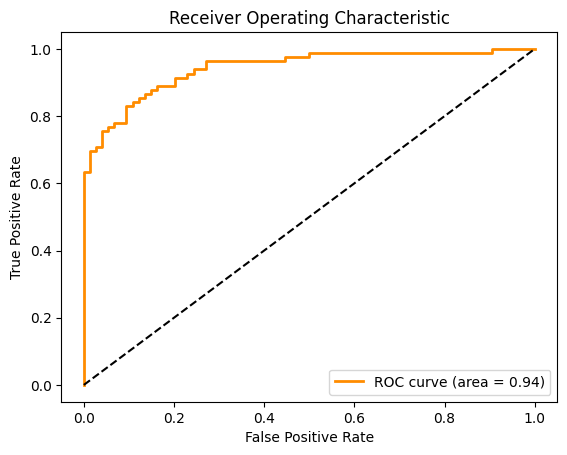

Minimum-D Threshold: 0.48487356


In [20]:
print("Minimum-D Threshold:", plot_roc(model_outputs, predictions, labels_test))

In [21]:
# Funkcija kuri atvaizduoja modelio spėjimus
def plot_results(images, actual_labels, predicted_labels, path, file_name):
    nrows = len(images)
    ncols = 4
    fig = plt.figure(figsize=(10, nrows * 2))
    for i, (image, actual, predicted) in enumerate(zip(images, actual_labels, predicted_labels)):
        # Display the image
        ax = fig.add_subplot(nrows, ncols, i + 1)
        ax.imshow(image, cmap="gray")
        ax.axis("off")
        color = "green"
        if actual != predicted:
            color = "red"
        ax.set_title(f"Actual: {actual}\nPredicted: {predicted}", color=color)

    fig.savefig(path + file_name + ".png", bbox_inches="tight")

    plt.tight_layout()
    plt.show()
    wandb.log({ 'Predictions' : fig })

In [23]:
# funkcija, grąžinanti paveikslėlių sąrašą pagal pateiktas nuorodas
def get_list_of_images(image_paths): 
    images = []
    for path in image_paths:
        img = plt.imread(path)
        images.append(img)
    return images

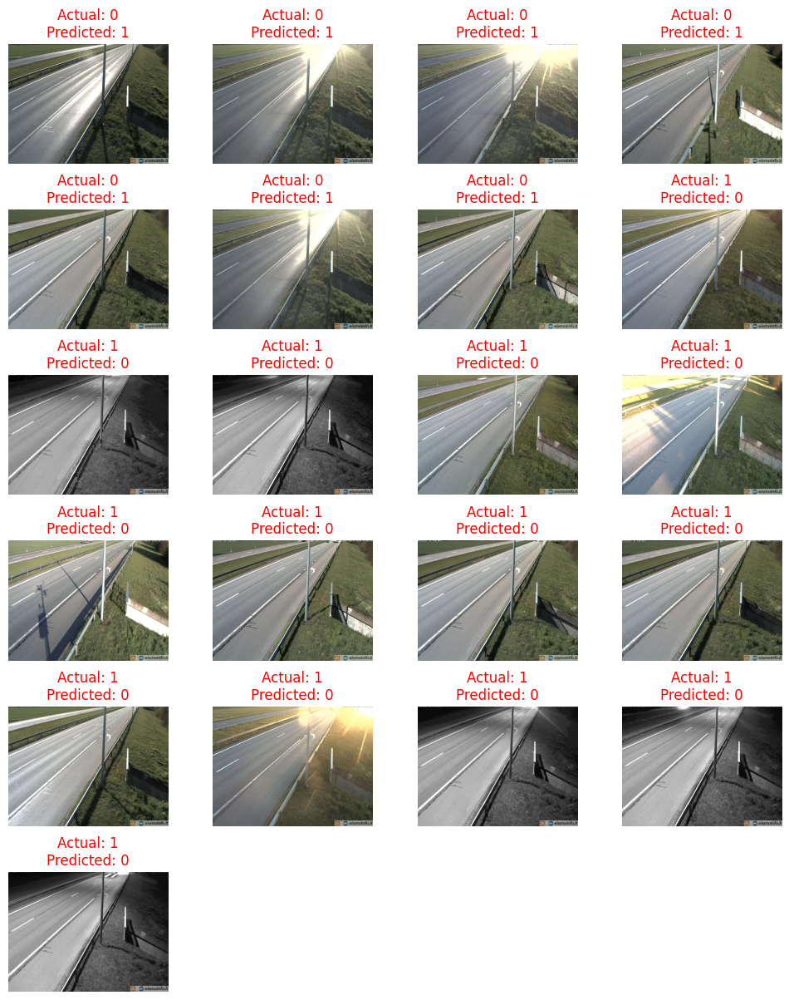

In [26]:
images = get_list_of_images(test_data.filepaths)
image_ids = [path.split("\\")[-1] for path in test_data.filepaths]

# Atfiltruojami neteisingai atspėti paveikslėliai
images_fail = []
actual_labels_fail = []
predicted_labels_fail = []
ids_fail = []
for image, actual, predicted, ids in zip(images, labels_test, predicted_classes, image_ids):
    if actual != predicted:
        images_fail.append(image)
        actual_labels_fail.append(actual)
        predicted_labels_fail.append(predicted)
        ids_fail.append(ids)

# Atvaizduojam neteisingai atspėtus paveikslėlius
plot_results(images_fail, actual_labels_fail, predicted_labels_fail, model_outputs, "Failed_Predictions")

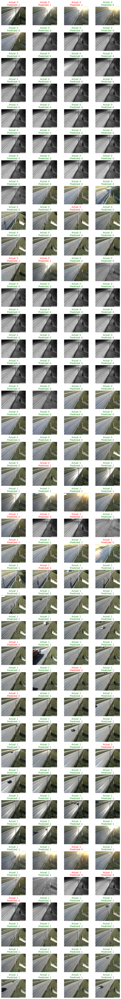

In [28]:
# Atvaizduojami visi paveikslėliai bei jų spėjimai
plot_results(images, labels_test, predicted_classes, model_outputs, 'Predictions')

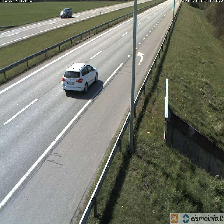

1/1 [==============================] - 0s 148ms/step


C:\Users\jolged\AppData\Local\Temp\ipykernel_17896\3135417779.py:36: RuntimeWarning: invalid value encountered in divide
  x /= x.std ()


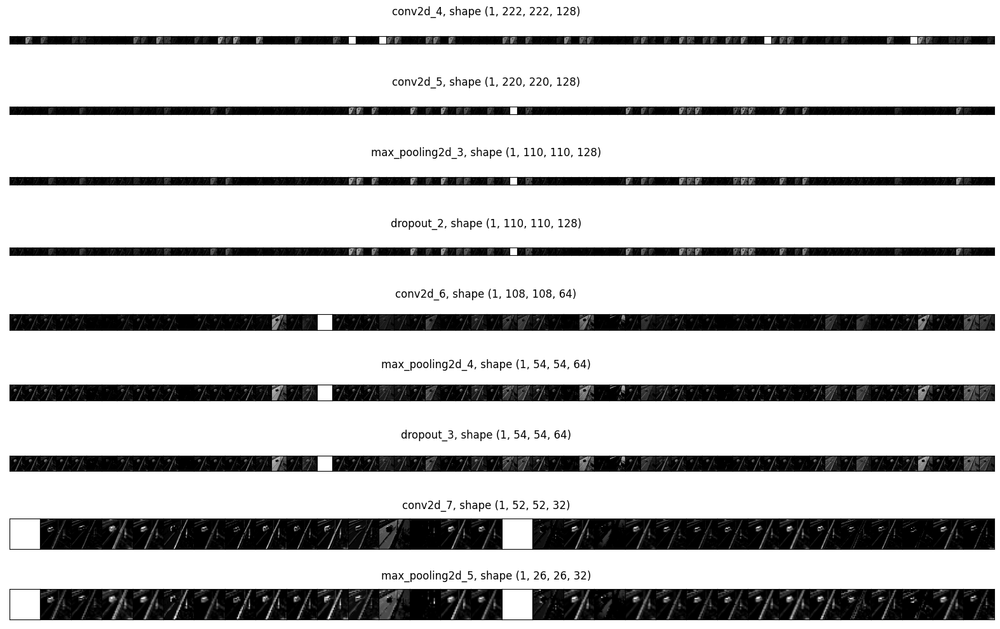

In [33]:
def get_feature_map(img_path, model_address):
    
    #Paruošiame paveikslėlį modelio padavimui
    img = load_img(img_path, target_size=(224, 224))
    display(img)
    x = img_to_array(img) 
    x = x.reshape((1,) + x.shape)
    x /= 255.0
    
    model = tf.keras.models.load_model(model_address)
    successive_outputs = [layer.output for layer in model.layers]
    visualization_model = tf.keras.models.Model(inputs = model.input, outputs = successive_outputs)

    #Praleidžiame paveikslėlį per modelio sluoksnius, kad gati tarpinius paveikslėlio variantus
    successive_feature_maps = visualization_model.predict(x)
    
    # Parametrai reikalingi atvaizdavimui
    layer_names = [layer.name for layer in model.layers]
    counter = len([sfm for sfm in successive_feature_maps if len(sfm.shape)==4])
    max_n_features = max([sfm.shape[-1] for sfm in successive_feature_maps if len(sfm.shape)==4])

    fig = plt.figure(figsize=(20, 10))
    fig.subplots_adjust(wspace=0, hspace=0)
    fig.suptitle('Figure title')
    subfigs = fig.subfigures(nrows=counter, ncols=1)

    counter = 1

    for layer_name, feature_map in zip(layer_names, successive_feature_maps):

        if len(feature_map.shape) == 4:
            n_features = feature_map.shape[-1]  # number of features in the feature map
            for i in range(n_features):
                x  = feature_map[0, :, :, i]
                x -= x.mean()
                x /= x.std ()
                x *=  64
                x += 128
                x  = np.clip(x, 0, 255).astype('uint8')

            ix = 1
            ax = subfigs[counter-1].subplots(1, n_features)
            subfigs[counter-1].suptitle(layer_name + ", shape " + str(feature_map.shape))
            for _ in range(n_features):
                ax[ix-1].set_xticks([])
                ax[ix-1].set_yticks([])
                ax[ix-1].imshow(feature_map[0, :, :, ix-1], cmap='gray')
                ix += 1
            counter +=1
    img_name_for_feature_map = img_path.split('\\')[-1].split('.')[0]
    plt.savefig(model_outputs + f'{img_name_for_feature_map}_feature_map.png')
    plt.show() 
    wandb.log({ f'{img_name_for_feature_map}_Feature_Map' : fig }) 

# for img_path in  test_data.filepaths[5:7]:
get_feature_map(test_data.filepaths[114], os.path.join(model_path, model_name))

In [34]:
wandb.finish()